In [15]:
import sys
mainpath='c:/Kitti/Dropbox/PHD/Gridshells-EQCS' #location of folders
sys.path.insert(0, mainpath+'/Tekno') #location of python files
geompath=mainpath+'/Saved particle-spring shapes/' #location of saved particle-spring shapes

In [6]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import Tekno as tk
import Types as tp
import numpy as np
import Plot as ptk
import TekGeom as tg
from scipy.interpolate import UnivariateSpline
from plotly.graph_objs import Layout, Data, Figure, Marker
from plotly.graph_objs import Scatter3d, Scatter, Histogram
from plotly import tools
from plotly.offline import iplot as iplt
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
from scipy import optimize
import pickle
import pandas as pd
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 12
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

In [16]:
import importlib #for reloading
importlib.reload(tk)
import Tekno as tk
importlib.reload(tg)
import TekGeom as tg
importlib.reload(tp)
import Types as tp
importlib.reload(ptk)
import Plot as ptk

# Parameters

materially and geometrically nonlinear finite element analysis to determine the ultimate load of grid shells

grid shells with various shape and pipe cross-section sizes (D, T)

to see results either load previously calculated and saved results or run analyses

In [8]:
Span=40
gN=16
D=150
t=10
LperHA=[8,5,3] #loop
nb=4
nNodes=2769

# Load results

In [10]:
with pd.HDFStore(mainpath+'/Saved results/alak.h5') as store:
    cpd = store['CapacityA']
    fpd = store['CapacityFA']
    lpd = store['loadA']
    dpd = store['dispA']
    cpd_an = store['CapacityA_an']
    fpd_an = store['CapacityFA_an']
    lpd_an = store['loadA_an']
    dpd_an = store['dispA_an']
    ldpd = store['lastDispA']
    ldpd_an = store['lastDispA_an']
size = 7
CapacityA=np.array(cpd).reshape(size,3,3)
CapacityFA=np.array(fpd).reshape(size,3,3)
loadAA=np.array(lpd).reshape(size,3,3,201)
dispA =np.array(dpd).reshape(size,3,3,201)
CapacityA_an=np.array(cpd_an).reshape(3,3)
CapacityFA_an=np.array(fpd_an).reshape(3,3)
loadAA_an=np.array(lpd_an).reshape(3,3,201)
dispA_an =np.array(dpd_an).reshape(3,3,201)
lastDispA =np.array(ldpd).reshape(size,3,3,nNodes,3)

In [11]:
# load imperfect results
with pd.HDFStore(mainpath+'/Saved results/alak_i.h5') as store:
    cpd = store['CapacityA']
    fpd = store['CapacityFA']
    lpd = store['loadA']
    dpd = store['dispA']
    cpd_an = store['CapacityA_an']
    fpd_an = store['CapacityFA_an']
    lpd_an = store['loadA_an']
    dpd_an = store['dispA_an']
size = 7
CapacityAi=np.array(cpd).reshape(size,3,3)
CapacityFAi=np.array(fpd).reshape(size,3,3)
loadAAi=np.array(lpd).reshape(size,3,3,201)
dispAi =np.array(dpd).reshape(size,3,3,201)
CapacityA_ani=np.array(cpd_an).reshape(3,3)
CapacityFA_ani=np.array(fpd_an).reshape(3,3)
loadAA_ani=np.array(lpd_an).reshape(3,3,201)
dispA_ani =np.array(dpd_an).reshape(3,3,201)

# Analysis

### Non-analytic shape

In [4]:
size = 7
GRSA       = np.zeros((size,3), dtype=tp.GridShell) # alak, L/H,
CapacityFA = np.zeros((size, 3, 3)) # alak, L/H, teher
CapacityA  = np.zeros((size, 3, 3))
loadAA     = np.zeros((size, 3, 3, 201))
dispA      = np.zeros((size, 3, 3, 201))
lastDispA  = np.zeros((size, 3, 3, nNodes,3))

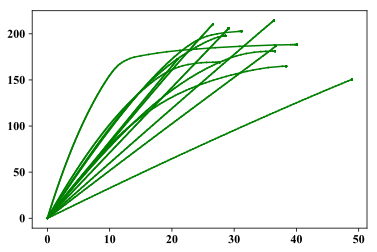

In [199]:
GeomType=4
for ll in range(2,3):
    LperH=LperHA[ll]
    Height=Span/LperH
    for j in range(3): 
        alakA=[110, 210, 310, 410, 610, 810, 1010]
        for k in range(4):
            alak=alakA[k]
            count=0
            GRS = tp.GridShell(Span,Height,D,t,gN,nb,GeomType,shape=alak)
            tk.CreateGeom(GRS, geompath)
            GRS.SupType = 1
            GRS.GeomNL = 1
            GRS.MatNL = 1
            GRS.LoadType = j
            GRS.Steps = 200
            GRS.MinStepSize = 0.001
            tk.BuildOpsModel(GRS)
            q=-40.
            for i in range(GRS.nbnBns):
                if GRS.LoadType == 0 \
                    or (GRS.GeomType==4 and GRS.LoadType == 1 and GRS.nsAll.x[GRS.nbn[i]] <= GRS.span / 2) \
                    or (GRS.GeomType==4 and GRS.LoadType == 2 and GRS.nsAll.y[GRS.nbn[i]] <= GRS.span / 2):
                        count+=1
            if j==0: area=Span**2
            else: area=Span**2/2
            Fz=q/count*area
            disp, force, ID, loadA, ok = tk.Analyze(GRS, Fz, 0, 0)
            _ = plt.plot(disp[:,ID,2],loadA, 'go-', ms=1) # dot plot
            CapacityA[k,ll,j]=loadA[-1]*count/area
            CapacityFA[k,ll,j]=loadA[-1]
            loadAA[k,ll,j,:]=loadA
            dispA[k,ll,j,:]=disp[:,ID,2]
            lastDispA[k,ll,j,:,0]=disp[-1,:,0]
            lastDispA[k,ll,j,:,1]=disp[-1,:,1]
            lastDispA[k,ll,j,:,2]=disp[-1,:,2]
            GRSA[k,ll]=GRS

In [208]:
#maximal beam length
GeomType=4
LavA  = np.zeros((7, 3))
MinLA = np.zeros((7, 3))
MaxLA = np.zeros((7, 3))
for ll in range(3): #L/H
    LperH=LperHA[ll]
    Height=Span/LperH
    alakA=[110, 210, 310, 410, 610, 810, 1010]
    for k in range(7):
        alak=alakA[k]
        filename = mainpath+'\\Saved particle-spring shapes\\{:d}x{:d}\\D{:d}{:d}\\h{:d}\\{:d}\\geometry{:s}.txt'.format(Span, Span, gN, gN, LperHA[ll], alak, '')
        with open(filename) as f:
            content = f.readlines()
        content = [x.strip() for x in content]
        LavA[k,ll] = float(content[36])  # m
        MinLA[k,ll] = float(content[34])  # m
        MaxLA[k,ll] = float(content[35])  # m
print(MaxLA)

[[ 3.07239299  3.84859162  5.5212296 ]
 [ 3.04163973  3.43168702  4.69985213]
 [ 3.05375963  3.44660473  4.40895257]
 [ 3.06702214  3.47654901  4.46142201]
 [ 3.09542741  3.54027011  4.59838519]
 [ 3.1252129   3.60636593  4.73867318]
 [ 3.15561561  3.67309988  4.87862181]]


### Analytic shape

In [173]:
GRSA_an        = np.zeros(3, dtype=tp.GridShell) # L/H
CapacityFA_an = np.zeros((3, 3)) # L/H, teher
CapacityA_an  = np.zeros((3, 3))
loadAA_an     = np.zeros((3, 3, 201))
dispA_an      = np.zeros((3, 3, 201))
lastDispA_an  = np.zeros((3, 3, GRS.nbNsAll,3))

233
120
124
233
120
124
233
120
124


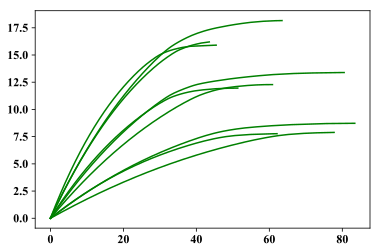

In [175]:
GeomType=2 #equilateral
for ll in range(3):
    LperH=LperHA[ll]
    Height=Span/LperH
    for j in range(3):
            count=0
            GRS = tp.GridShell(Span,Height,D,t,gN,nb,GeomType)
            tk.CreateGeom(GRS)
            GRS.SupType = 1
            GRS.GeomNL = 1
            GRS.MatNL = 1
            GRS.LoadType = j
            GRS.Steps = 200
            GRS.MinStepSize = 0.001
            tk.BuildOpsModel(GRS)
            q=-20.
    
            for i in range(GRS.nbnBns):
                if GRS.LoadType == 0 \
                    or (GRS.GeomType in {0, 1, 2} and GRS.LoadType == 1 and GRS.nsAll.x[GRS.nbn[i]] <= 0) \
                    or (GRS.GeomType in {0, 1, 2} and GRS.LoadType == 2 and GRS.nsAll.y[GRS.nbn[i]] <= 0) :
                        count+=1
            if j==0: area=Span**2
            else: area=Span**2/2
            Fz=q/count*area
            print(count)
            disp, force, ID, loadA, ok = tk.Analyze(GRS, Fz, 0, 0)
            _ = plt.plot(disp[:,ID,2],loadA*count/area, 'g') # dot plot
            CapacityA_an[ll,j]=loadA[-1]*count/area
            CapacityFA_an[ll,j]=loadA[-1]
            loadAA_an[ll,j,:]=loadA
            dispA_an[ll,j,:]=disp[:,ID,2]
            lastDispA_an[ll,j,:,0]=disp[-1,:,0]
            lastDispA_an[ll,j,:,1]=disp[-1,:,1]
            lastDispA_an[ll,j,:,2]=disp[-1,:,2]
            if j==0: GRSA_an[ll]=GRS

# Results

In [12]:
# finding the best shape
maxqA=np.zeros(3)
bestShapeA=np.zeros(3)
qminA=np.zeros((7,3))
for ll in range(3): #L/H
    for k in range(7):
        minq=100
        for j in range(3): #load
            if minq>CapacityA[k,ll,j]:
                minq=CapacityA[k,ll,j]
        qminA[k,ll]=minq        
        if maxqA[ll]<minq:
                maxqA[ll]=minq
                bestShapeA[ll]=k
print(bestShapeA,maxqA)      

[ 3.  2.  2.] [ 12.95507812  22.5546875   29.20546875]


In [13]:
# finding the best shape for imperfect results
maxqA=np.zeros(3)
bestShapeA=np.zeros(3)
qminAi=np.zeros((7,3))
for ll in range(3): #L/H
    for k in range(7):
        minq=100
        for j in range(3): #load
            if minq>CapacityAi[k,ll,j]:
                minq=CapacityAi[k,ll,j]
        qminAi[k,ll]=minq        
        if maxqA[ll]<minq:
                maxqA[ll]=minq
                bestShapeA[ll]=k
print(bestShapeA,maxqA)      

[ 3.  3.  2.] [  5.80195313   9.26015625  12.48105469]


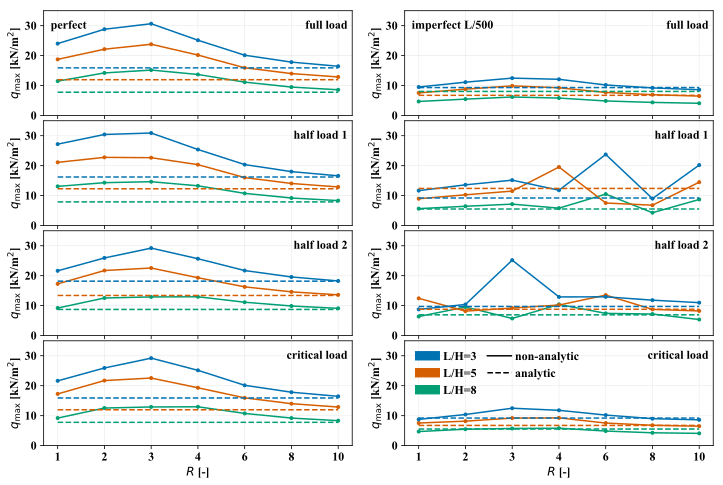

In [14]:
c1=[c/255. for c in [213., 94., 0.]] # vermillion
c2=[c/255. for c in [0, 158, 115]] # bluish green
c3=[c/255. for c in [240, 228, 66]]  # yellow
c4=[c/255. for c in [0, 114, 178]]   # blue
c5=[c/255. for c in [204, 121, 167]] # reddish purple
c6=[c/255. for c in [86, 180, 233]] # sky blue
#c1=[c/255. for c in [230, 159, 0]]   # orange
sms=3
fig = plt.figure(figsize=(12, 8))
gs = gridspec.GridSpec(4, 2)
gs.update(wspace=0.17, hspace=0.05)
x=[1,2,3,4,5,6,7]
gh=35
th=29
jb=7.2

ax1 = plt.subplot(gs[0, 0])
j=0
plt.plot(x,CapacityA[:,0,j],'o-', c=c2, ms=sms)
plt.plot(x,CapacityA[:,1,j],'o-', c=c1, ms=sms)
plt.plot(x,CapacityA[:,2,j],'o-', c=c4, ms=sms)
plt.plot([1,7],[CapacityA_an[0,j],CapacityA_an[0,j]],'--', c=c2) #analytic
plt.plot([1,7],[CapacityA_an[1,j],CapacityA_an[1,j]],'--', c=c1) #analytic
plt.plot([1,7],[CapacityA_an[2,j],CapacityA_an[2,j]],'--', c=c4) #analytic
plt.ylabel('$q_{\\rm max}$ [kN/m$^2$]')
plt.ylim(0,gh)
plt.xticks(x,[])
plt.yticks(np.arange(0,gh+0.1,10))
plt.text(jb, th, 'full load',horizontalalignment='right')
plt.text(0.85, th, 'perfect')
ax1.grid(which='major', alpha=0.2)

ax2 = plt.subplot(gs[1,0])
j=1
plt.plot(x,CapacityA[:,0,j],'o-', c=c2, ms=sms)
plt.plot(x,CapacityA[:,1,j],'o-', c=c1, ms=sms)
plt.plot(x,CapacityA[:,2,j],'o-', c=c4, ms=sms)
plt.plot([1,7],[CapacityA_an[0,j],CapacityA_an[0,j]],'--', c=c2) #analytic
plt.plot([1,7],[CapacityA_an[1,j],CapacityA_an[1,j]],'--', c=c1) #analytic
plt.plot([1,7],[CapacityA_an[2,j],CapacityA_an[2,j]],'--', c=c4) #analytic
plt.ylabel('$q_{\\rm max}$ [kN/m$^2$]')
plt.ylim(0,gh)
plt.xticks(x,[])
plt.yticks(np.arange(0,gh+0.1,10))
plt.text(jb, th, 'half load 1',horizontalalignment='right')
ax2.grid(which='major', alpha=0.2)

ax3 = plt.subplot(gs[2,0])
j=2
plt.plot(x,CapacityA[:,0,j],'o-', c=c2, ms=sms)
plt.plot(x,CapacityA[:,1,j],'o-', c=c1, ms=sms)
plt.plot(x,CapacityA[:,2,j],'o-', c=c4, ms=sms)
plt.plot([1,7],[CapacityA_an[0,j],CapacityA_an[0,j]],'--', c=c2) #analytic
plt.plot([1,7],[CapacityA_an[1,j],CapacityA_an[1,j]],'--', c=c1) #analytic
plt.plot([1,7],[CapacityA_an[2,j],CapacityA_an[2,j]],'--', c=c4) #analytic
plt.ylabel('$q_{\\rm max}$ [kN/m$^2$]')
plt.ylim(0,gh)
plt.yticks(np.arange(0,gh+0.1,10))
plt.xticks(x,[])
plt.text(jb, th, 'half load 2',horizontalalignment='right')
ax3.grid(which='major', alpha=0.2)

ax4 = plt.subplot(gs[3,0])
plt.plot(x,qminA[:,0],'o-', c=c2, ms=sms)
plt.plot(x,qminA[:,1],'o-', c=c1, ms=sms)
plt.plot(x,qminA[:,2],'o-', c=c4, ms=sms)
m1=min(CapacityA_an[0,0],CapacityA_an[0,1],CapacityA_an[0,2])
m2=min(CapacityA_an[1,0],CapacityA_an[1,1],CapacityA_an[1,2])
m3=min(CapacityA_an[2,0],CapacityA_an[2,1],CapacityA_an[2,2])
plt.plot([1,7],[m1,m1],'--', c=c2) #analytic
plt.plot([1,7],[m2,m2],'--', c=c1) #analytic
plt.plot([1,7],[m3,m3],'--', c=c4) #analytic
plt.xlabel('$R$ [-]')
plt.ylabel('$q_{\\rm max}$ [kN/m$^2$]')
plt.ylim(0,gh)
plt.yticks(np.arange(0,gh+0.1,10))
plt.xticks(x,['1', '2', '3', '4', '6', '8', '10'])
plt.text(jb, th, 'critical load',horizontalalignment='right')
ax4.grid(which='major', alpha=0.2)

# IMPERFECT
ax5 = plt.subplot(gs[0, 1])
j=0
plt.plot(x,CapacityAi[:,0,j],'o-', c=c2, ms=sms)
plt.plot(x,CapacityAi[:,1,j],'o-', c=c1, ms=sms)
plt.plot(x,CapacityAi[:,2,j],'o-', c=c4, ms=sms)
plt.plot([1,7],[CapacityA_ani[0,j],CapacityA_ani[0,j]],'--', c=c2) #analytic
plt.plot([1,7],[CapacityA_ani[1,j],CapacityA_ani[1,j]],'--', c=c1) #analytic
plt.plot([1,7],[CapacityA_ani[2,j],CapacityA_ani[2,j]],'--', c=c4) #analytic
plt.ylabel('$q_{\\rm max}$ [kN/m$^2$]')
plt.ylim(0,gh)
plt.xticks(x,[])
plt.yticks(np.arange(0,gh+0.1,10))
plt.text(jb, th, 'full load',horizontalalignment='right')
plt.text(0.85, th, 'imperfect L/500')
ax5.grid(which='major', alpha=0.2)

ax6 = plt.subplot(gs[1,1])
j=1
plt.plot(x,CapacityAi[:,0,j],'o-', c=c2, ms=sms)
plt.plot(x,CapacityAi[:,1,j],'o-', c=c1, ms=sms)
plt.plot(x,CapacityAi[:,2,j],'o-', c=c4, ms=sms)
plt.plot([1,7],[CapacityA_ani[0,j],CapacityA_ani[0,j]],'--', c=c2) #analytic
plt.plot([1,7],[CapacityA_ani[1,j],CapacityA_ani[1,j]],'--', c=c1) #analytic
plt.plot([1,7],[CapacityA_ani[2,j],CapacityA_ani[2,j]],'--', c=c4) #analytic
plt.ylabel('$q_{\\rm max}$ [kN/m$^2$]')
plt.ylim(0,gh)
plt.xticks(x,[])
plt.yticks(np.arange(0,gh+0.1,10))
plt.text(jb, th, 'half load 1',horizontalalignment='right')
ax6.grid(which='major', alpha=0.2)

ax7 = plt.subplot(gs[2,1])
j=2
plt.plot(x,CapacityAi[:,0,j],'o-', c=c2, ms=sms)
plt.plot(x,CapacityAi[:,1,j],'o-', c=c1, ms=sms)
plt.plot(x,CapacityAi[:,2,j],'o-', c=c4, ms=sms)
plt.plot([1,7],[CapacityA_ani[0,j],CapacityA_ani[0,j]],'--', c=c2) #analytic
plt.plot([1,7],[CapacityA_ani[1,j],CapacityA_ani[1,j]],'--', c=c1) #analytic
plt.plot([1,7],[CapacityA_ani[2,j],CapacityA_ani[2,j]],'--', c=c4) #analytic
plt.ylabel('$q_{\\rm max}$ [kN/m$^2$]')
plt.ylim(0,gh)
plt.yticks(np.arange(0,gh+0.1,10))
plt.xticks(x,[])
plt.text(jb, th, 'half load 2',horizontalalignment='right')
ax7.grid(which='major', alpha=0.2)

ax8 = plt.subplot(gs[3,1])
ax8.grid(which='major', alpha=0.2)
plt.plot(x,qminAi[:,0],'o-', c=c2, ms=sms)
plt.plot(x,qminAi[:,1],'o-', c=c1, ms=sms)
plt.plot(x,qminAi[:,2],'o-', c=c4, ms=sms)
m1=min(CapacityA_ani[0,0],CapacityA_ani[0,1],CapacityA_ani[0,2])
m2=min(CapacityA_ani[1,0],CapacityA_ani[1,1],CapacityA_ani[1,2])
m3=min(CapacityA_ani[2,0],CapacityA_ani[2,1],CapacityA_ani[2,2])
plt.plot([1,7],[m1,m1],'--', c=c2) #analytic
plt.plot([1,7],[m2,m2],'--', c=c1) #analytic
plt.plot([1,7],[m3,m3],'--', c=c4) #analytic
plt.xlabel('$R$ [-]')
plt.ylabel('$q_{\\rm max}$ [kN/m$^2$]')
plt.ylim(0,gh)
plt.yticks(np.arange(0,gh+0.1,10))
plt.xticks(x,['1', '2', '3', '4', '6', '8', '10'])
plt.text(jb, th, 'critical load',horizontalalignment='right')

c_patch = mpatches.Patch(color=c2, label='L/H=8')
b_patch = mpatches.Patch(color=c1, label='L/H=5')
g_patch = mpatches.Patch(color=c4, label='L/H=3')
ref_ln1 = mlines.Line2D([], [], color='k', label='non-analytic',linestyle='-')
ref_ln2 = mlines.Line2D([], [], color='k', label='analytic',linestyle='--')
plt.legend(handles=[g_patch,b_patch,c_patch,ref_ln1,ref_ln2],frameon=False,loc=2,ncol=2,handletextpad=0.3,columnspacing=0.9)

plt.savefig('alak.pdf', bbox_inches='tight')
plt.show()

# Viewer

In [280]:
iplt(ptk.PlotDef(GRSA[k,ll], ID, lastDispA[k,ll,j,:,:], 50, True, False,2))

In [279]:
k=6
ll=1
j=0
leMax=0
ID=0
for i in range(2769):
    le=(lastDispA[k,ll,j,i,0]**2+lastDispA[k,ll,j,i,1]**2+lastDispA[k,ll,j,i,2]**2)
    if le>leMax:
        leMax=le
        ID=i
iplt(ptk.PlotDef(GRSA[k,ll], ID, lastDispA[k,ll,j,:,:], 50, True, False,1))

In [283]:
ll=1
j=0
leMax=0
ID=0
for i in range(2769):
    le=(lastDispA_an[ll,j,i,0]**2+lastDispA_an[ll,j,i,1]**2+lastDispA_an[ll,j,i,2]**2)
    if le>leMax:
        leMax=le
        ID=i
iplt(ptk.PlotDef(GRSA_an[ll], ID, lastDispA_an[ll,j,:,:], 50, True, False,mode=1))

In [284]:
iplt(ptk.PlotDef(GRSA_an[ll], ID, lastDispA_an[ll,j,:,:], 50, True, False,mode=2))

# Save results

In [289]:
A_df = pd.DataFrame(CapacityA.flatten())
B_df = pd.DataFrame(CapacityFA.flatten())
C_df = pd.DataFrame(loadAA.flatten()) 
D_df = pd.DataFrame(dispA.flatten())
E_df = pd.DataFrame(CapacityA_an.flatten())
F_df = pd.DataFrame(CapacityFA_an.flatten())
G_df = pd.DataFrame(loadAA_an.flatten()) 
H_df = pd.DataFrame(dispA_an.flatten())
I_df = pd.DataFrame(lastDispA.flatten())
J_df = pd.DataFrame(lastDispA_an.flatten())
with pd.HDFStore(mainpath+'/Saved results/alak.h5') as store:
    store['CapacityA']  = A_df
    store['CapacityFA'] = B_df
    store['loadA']      = C_df
    store['dispA']      = D_df
    store['CapacityA_an'] = E_df
    store['CapacityFA_an']= F_df
    store['loadA_an']     = G_df
    store['dispA_an']     = H_df
    store['lastDispA']    = I_df
    store['lastDispA_an'] = J_df